![PUBG_Logo](assets/PUBG_logo.png)

## Objective
* Employ Anomaly Detection algorithms on dataset.
* Discuss pertinent results.

## Background Information
* Playerunknown's Battleground (PUBG) is a video game, which set the standard for preceding games in the Battle Royale Genre. The main goal is to SURVIVE at all costs.

## Process:
* Exploratory Data Analysis conducted utilizing various python packages (Numpy, Matplotlib, Pandas, and Plotly).
* Anomaly Detection Algorithms (Sci-Kit Learn)
    * Local Outlier Field
    * Ellipitic Envelope
    * Isolation Forest


## Table of Contents:
* Part I: Exploratory Data Analysis
    * EDA
* Part II: Anomaly Detection Algorithm
    * Local Outlier Field
    * Ellipitic Envelope
    * Isolation Forest
* Part III: Isolation Forest in 2D

In [1]:
from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn.covariance import EllipticEnvelope
from sklearn.decomposition import PCA
from sklearn.ensemble import IsolationForest
from sklearn.neighbors import LocalOutlierFactor
from sklearn.preprocessing import StandardScaler

import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly.express as px
import seaborn as sns

# PART I - Exploratory Data Analysis

### Data Preprocessing / Feature Engineering

Let us begin by reading in the CSV file containing the data, and examining the data contents such as the number of features and rows. It seems there are 152 column entries (features) and 87898 row entries (number of samples).

In [2]:
#--------- Pandas Dataframe
## Read in CSV
orig = pd.read_csv('data/PUBG_Player_Statistics.csv')

Now, let us remove and combine features, which do not pertain to our goal of clustering solo player behavior. 

Remove:
* player_name
* tracker_id
* duo
* squad

Add:
* Total Distance

This can be achieved by removing all columns after the 52nd. Also, create a new feature that combines the walking and riding distance.

Also, we will reduce the variance in the data by removing players with less than the mean number of rounds in our data.

In [3]:
#---------Preprocessing
## Create a copy of the dataframe
df = orig.copy()
cols = np.arange(52, 152, 1)

# Drop entries if they have null values
df.dropna(inplace = True)

## Drop columns after the 52nd index
df.drop(df.columns[cols], axis = 1, inplace = True)

## Drop player_name and tracker id
df.drop(df.columns[[0, 1]], axis = 1, inplace = True)

## Drop Knockout and Revives
df.drop(df.columns[[49]], axis = 1, inplace = True)
df.drop(columns = ['solo_Revives'], inplace = True)

## Drop the string solo from all strings
df.rename(columns = lambda x: x.lstrip('solo_').rstrip(''), inplace = True)

## Combine a few columns 
df['TotalDistance'] = df['WalkDistance'] + df['RideDistance']
df['AvgTotalDistance'] = df['AvgWalkDistance'] + df['AvgRideDistance']

# Remove Outliers
df = df.drop(df[df['RoundsPlayed'] < df['RoundsPlayed'].mean()].index)

Split the data into three sets: train, dev, and test set.

In [4]:
# Create train and test set using Sci-Kit Learn
train, test = train_test_split(df, test_size=0.3, random_state = 10)
dev, test = train_test_split(test, test_size = 0.2, random_state = 10)
data = train

print("The number of training samples is", len(train))
print("The number of development samples is", len(dev))
print("The number of testing samples is", len(test))

The number of training samples is 20771
The number of development samples is 7121
The number of testing samples is 1781


It is important we go through the final output to make sure that are data preprocessing is complete. And it looks great!

In [5]:
with pd.option_context('display.max_columns', 52):
    print(data.describe(include = 'all'))

       KillDeathRatio      WinRatio  TimeSurvived  RoundsPlayed          Wins  \
count    20771.000000  20771.000000  2.077100e+04  20771.000000  20771.000000   
mean         1.289158      2.204012  1.484172e+05    174.985894      3.554475   
std          0.602602      2.510500  9.339460e+04    113.147056      4.939222   
min          0.100000      0.000000  3.813548e+04     80.000000      0.000000   
25%          0.900000      0.680000  9.091498e+04    104.000000      1.000000   
50%          1.160000      1.460000  1.195404e+05    139.000000      2.000000   
75%          1.520000      2.910000  1.733681e+05    205.000000      4.000000   
max         17.410000     40.210000  1.219536e+06   1552.000000    102.000000   

       WinTop10Ratio        Top10s    Top10Ratio        Losses        Rating  \
count   20771.000000  20771.000000  20771.000000  20771.000000  20771.000000   
mean        0.138708     23.884743     14.369067    171.431419   2059.159131   
std         0.137145     19.21

The only factors above which have a positive correlation to average survival time are Average Total Distance, Win Ratio, and Top 10 Ratio.

# PART 2 - Clustering

Procedure: 
* LoF
    * 3D
* Elliptic
    * 3D
* IsolatorForest
    * 3D


### Clustering in 3D (All Features)

Feature scaling is utilized to make sure all features are normalized and have similar orders of magnitude. This is important because our clustering algorithms look into calculating the distance between points. In our case, we employed a zero-mean and unit-variance scaling.

In [7]:
# Scale the data (Normalize)
scaler = StandardScaler()
X_train_std = scaler.fit_transform(train)
X_dev_std = scaler.transform(dev)
X_test_std = scaler.transform(test)

### Principal Components Analysis

The Principal Component Analysis is a dimensional reduction technique that preserves the essence of the original data [1]. Having multi-dimensional data (many features), it is very important in identifying which features are important. PCA finds a new set of dimensions (or a set of basis of views) such that all the dimensions are orthogonal (and hence linearly independent) and ranked according to the variance of data along with them.


#### Algorithm 
1. Calculate the covariance matrix X of data points.
2. Calculate eigenvectors and corresponding eigen values.
3. Sort the eigenvectors according to their eigen values in decreasing order.
4. Choose first k eigen vectors and that will be the new k dimensions.
5. Transform the original n dimensional data points into k dimensions.


#### Parameters

PCA has one parameter:
* Number of components



#### Optimal Number of Components

Now, we'll want to identify the optimal number of principal components. We'll plot the cumulative distribution of variance across several principal components, and identify the number of components that describe 85% of the variance in the data.

Our data suggests 0 - 11 components describe the data, thus a total of 12 components will be used.

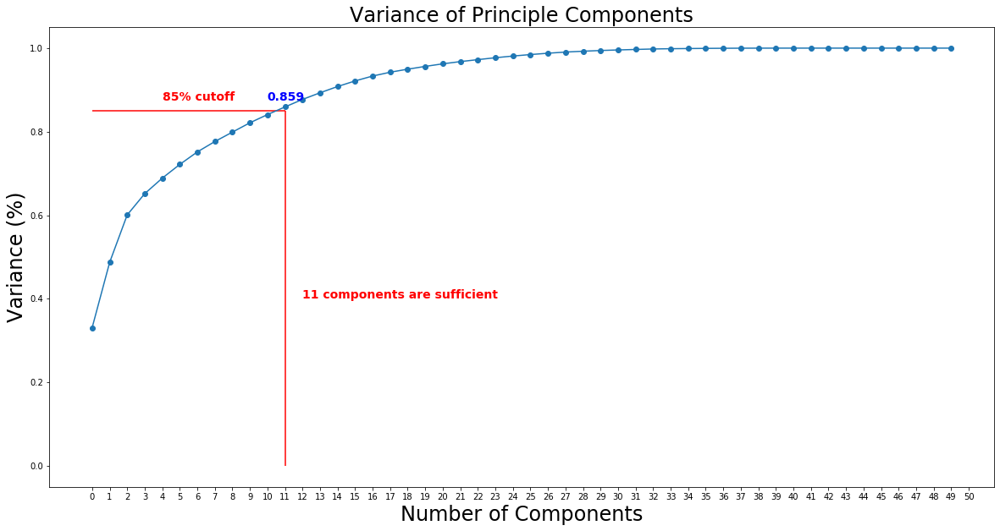

In [8]:
# Fitting the PCA algorithm with our Data
pca = PCA().fit(X_train_std)
pca_variance_components = np.cumsum(pca.explained_variance_ratio_)

# Plotting the Cumulative Summation of the Explained Variance
## Plot Parameters
plt.figure(figsize=(20,10))
plt.plot(pca_variance_components, '-o')
plt.xlabel('Number of Components', fontsize = 24)
plt.xticks(range(0,51))
plt.ylabel('Variance (%)', fontsize = 24) 
plt.title('Variance of Principle Components', fontsize = 24)

## Annotate plot 
plt.text(4, pca_variance_components[11] + 0.015,
         '85% cutoff', size = 14, color = 'red', weight = 'semibold')

plt.hlines(y = 0.85, color='red', linestyle = '-', xmin = 0.0, xmax = 11)

plt.text(10, pca_variance_components[11] + 0.015,
         str(round(pca_variance_components[11], 3)), size = 14, color = 'blue', weight = 'semibold')

plt.text(12, 0.4,
         '11 components are sufficient', size = 14, color = 'red', weight = 'semibold')

plt.vlines(x=11, color='red', linestyle = '-', ymin = 0.0, ymax = 0.85)

plt.show()

Let's see how the variance is distributed across our components. We identify that 3-4 components contain most of variance (~60%), so we'll examine those first four components in our visualizations.

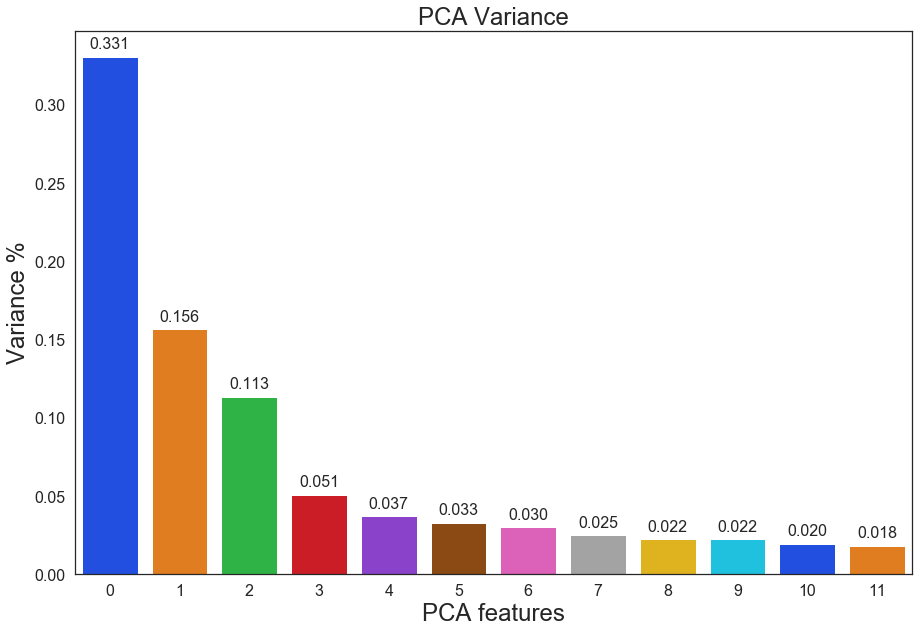

In [9]:
## Principle Components Analysis
# Set PCA parameters
pca = PCA(n_components = 12, random_state = 10)

# Fit and transform
principalComponents = pca.fit(X_train_std)
features = range(pca.n_components_)
principalComponents_variance = principalComponents.explained_variance_ratio_

# Plot the expected variance
plt.figure(figsize = (15,10))
sns.set(style = "white", rc = {"lines.linewidth": 3})
ax = sns.barplot(x = np.array(features), y = principalComponents.explained_variance_ratio_, palette = "bright")
plt.xlabel('PCA features', fontsize = 24)
plt.ylabel('Variance %', fontsize = 24)
plt.title('PCA Variance', fontsize = 24)
plt.xticks(features, fontsize = 16)
plt.yticks(fontsize = 16)

# Function to add labels to bar chart
def add_value_labels(ax, spacing=5):
    """Add labels to the end of each bar in a bar chart.

    Arguments:
        ax (matplotlib.axes.Axes): The matplotlib object containing the axes
            of the plot to annotate.
        spacing (int): The distance between the labels and the bars.
    """
    # For each bar: Place a label
    for rect in ax.patches:
        # Get X and Y placement of label from rect.
        y_value = rect.get_height()
        x_value = rect.get_x() + rect.get_width() / 2

        # Number of points between bar and label. Change to your liking.
        space = spacing
        # Vertical alignment for positive values
        va = 'bottom'

        # If value of bar is negative: Place label below bar
        if y_value < 0:
            # Invert space to place label below
            space *= -1
            # Vertically align label at top
            va = 'top'

        # Use Y value as label and format number with one decimal place
        label = "{:.3f}".format(y_value)

        # Create annotation
        ax.annotate(
            label,                      # Use `label` as label
            (x_value, y_value),         # Place label at end of the bar
            xytext=(0, space),          # Vertically shift label by `space`
            textcoords="offset points", # Interpret `xytext` as offset in points
            ha='center',                # Horizontally center label
            fontsize = '16',            # Font size
            va=va)                      # Vertically align label differently for
                                        # positive and negative values.

# Call the function above
add_value_labels(ax)

plt.show()

Before, we begin with clustering we want to transform the training data using PCA.

In [10]:
# Set PCA number of components
pca = PCA(n_components = 12, random_state = 10)

In [11]:
def pca_Fit_Transform(df):
    """Function to fit and transform the dataframe and rename the PCA components"""
    PCA_DF = pca.fit_transform(df)
    PCA_DF = pd.DataFrame(PCA_DF)
    
    # Rename PCA column names
    x = (np.array(PCA_DF.columns)+1)
    columns = []
    for i in x:
        columns.append('PCA' + ' ' + str(i))
    PCA_DF.columns = columns
    
    return PCA_DF

In [12]:
def pca_Transform(df):
    """Function to transform the dataframe and rename the PCA components"""
    PCA_DF = pca.transform(df)
    PCA_DF = pd.DataFrame(PCA_DF)
    
    # Rename PCA column names
    x = (np.array(PCA_DF.columns)+1)
    columns = []
    for i in x:
        columns.append('PCA' + ' ' + str(i))
    PCA_DF.columns = columns
    
    return PCA_DF

In [13]:
PCA_components_train = pca_Fit_Transform(X_train_std)
PCA_components_dev = pca_Transform(X_dev_std)
PCA_components_test = pca_Transform(X_test_std)

o_PCA_components_train = pca_Fit_Transform(X_train_std)
o_PCA_components_dev = pca_Transform(X_dev_std)
o_PCA_components_test = pca_Transform(X_test_std)

#### Local Outlier Factor

LOF compares outliers to their local neighborhood rather than the global data distribution. Because the density around an outlier object is different than the density around the neighbors. The method involves using the relative density of an object against its neighbors as indicator of the degree of the object being outliers.

##### Algorithm
1. Arbitrarily select a point P.
2. Calculate distances between P and every other point.
3. Find the Kth closest point
4. Find K closest points whose distances are smaller than the Kth point.
5. Find its Local Reachability Density (how close its neighbors are to it), the lower the density, the farther p from its neighbors.
6. Find its local outlier factor, the sum of the distances between P and its neighboring points.


##### Parameters

In LOF, we'll be examining two parameters:
* contamination: proportion of outliers in a dataset. 
* num_neighbors (K): the minimum number of points to form a dense region.

For contamination: We'll be making an educated guess given this article stating that out of 26,000,000 accounts, 1,500,000 were caught cheating ~ 0.58% [2]. However, this does not include the people who didnt get caught with cheating. 

For num_neighbors: We'll be using a research paper on LOF to select the k-number of neearest neighbors. If you want to consider a point near a group of N points as an outlier, rather than part of that group, your k value should be at least N, ~2000 [3]. 

Begin with configuring all parameters for LOF.

In [14]:
LOF = LocalOutlierFactor(n_neighbors = 2000, contamination = 0.0058)

In [15]:
labels = LOF.fit_predict(PCA_components_train)

Silhouette analysis studies how similar and dissimilar neighboring cluster centroids are. We select the point which is closest to +1. In our case, the parameters have a silhouette score of 0.7241.

In [17]:
# Print Silhouette Score
ss = metrics.silhouette_score(PCA_components_train, labels)
print('The Silhouette Score for the training set is ' + str(ss) + ".")

The Silhouette Score for the training set is 0.7241593491140105.


Next, load in our function to plot our 3D scatter plots.

In [18]:
def scatter3d_cluster(df, x, y, z, code, title):
    scatter = px.scatter_3d(df, x=x, y=y, z=z, color = code,  
                            color_discrete_sequence=px.colors.qualitative.Light24)
    
    scatter.update_layout(title = title, title_font = dict(size = 30),
                          scene = dict(
                              xaxis = dict(
                                  backgroundcolor="rgb(200, 200, 230)",
                                  gridcolor="white",
                                  showbackground=True,
                                  zerolinecolor="white",
                                  nticks=10, ticks='outside',
                                  tick0=0, tickwidth = 4,
                                  title_font = dict(size = 16)),
                              yaxis = dict(
                                  backgroundcolor="rgb(230, 200,230)",
                                  gridcolor="white",
                                  showbackground=True,
                                  zerolinecolor="white",
                                  nticks=10, ticks='outside',
                                  tick0=0, tickwidth = 4,
                                  title_font = dict(size = 16)),
                              zaxis = dict(
                                  backgroundcolor="rgb(230, 230,200)",
                                  gridcolor="white",
                                  showbackground=True,
                                  zerolinecolor="white",
                                  nticks=10, ticks='outside',
                                  tick0=0, tickwidth = 4,
                                  title_font = dict(size = 16),
                              ),
                          ),
                          width = 700
                         )
    return scatter.show()

Lastly, plot the data and let's label the data with our assumptions on how hackers are perceived.

Hackers tend to have high Kill-Death Ratios, Headshot-Kill Ratios, Top 10 Ratios, and Win Ratios.

In [19]:
## 3D Plot of Training Data
# Create and modify dataframe for the cluster column
PCA_components_train['Cluster'] = pd.Series(labels, index = PCA_components_train.index)

#Rename Cluster label names from k-means
cluster_label_names = {1: "Humans", -1: 'Hackers'}
PCA_components_train['Cluster_Labels'] = PCA_components_train['Cluster'].map(cluster_label_names)  

# Plots of PCA 1, PCA 2, PCA 3
scatter3d_cluster(df = PCA_components_train , x = 'PCA 1',
                  y = 'PCA 2', z = 'PCA 3', code = 'Cluster_Labels', title = 'PCA')

In [22]:
PCA_components_train['Cluster'].value_counts()

 1    20650
-1      121
Name: Cluster, dtype: int64

From the plots, we observed roughly 20650 humans and 121 hackers. 

In [23]:
PCA_components_train.groupby('Cluster_Labels').count()

,PCA 1,PCA 2,PCA 3,PCA 4,PCA 5,PCA 6,PCA 7,PCA 8,PCA 9,PCA 10,PCA 11,PCA 12,Cluster
Cluster_Labels,,,,,,,,,,,,,
Hackers,121,121,121,121,121,121,121,121,121,121,121,121,121
Humans,20650,20650,20650,20650,20650,20650,20650,20650,20650,20650,20650,20650,20650


##### Predicting on the dev set

Begin with predicting on the dev set.

In [24]:
LOF = LocalOutlierFactor(n_neighbors = 2000, contamination = 0.0058, novelty = True).fit(o_PCA_components_train)

In [25]:
predict_labels = LOF.predict(PCA_components_dev)

Next, create the 3D scatter plots.

In [26]:
## 3D Plot of deving Data
# Create and modify dataframe for the cluster column
PCA_components_dev['Cluster'] = pd.Series(predict_labels, index = PCA_components_dev.index)

#Rename Cluster label names from k-means
cluster_label_names = {1: "Humans", -1: 'Hackers'}
PCA_components_dev['Cluster_Labels'] = PCA_components_dev['Cluster'].map(cluster_label_names)  

# Plots of PCA 1, PCA 2, PCA 3
scatter3d_cluster(df = PCA_components_dev , x = 'PCA 1',
                  y = 'PCA 2', z = 'PCA 3', code = 'Cluster_Labels', title = 'PCA')

From the plots, we observed roughly 7081 humans and 40 hackers.

In [29]:
PCA_components_dev.groupby('Cluster_Labels').count()

,PCA 1,PCA 2,PCA 3,PCA 4,PCA 5,PCA 6,PCA 7,PCA 8,PCA 9,PCA 10,PCA 11,PCA 12,Cluster
Cluster_Labels,,,,,,,,,,,,,
Hackers,40,40,40,40,40,40,40,40,40,40,40,40,40
Humans,7081,7081,7081,7081,7081,7081,7081,7081,7081,7081,7081,7081,7081


##### Predicting on the test set

Begin with predicting on the test set.

In [30]:
LOF = LocalOutlierFactor(n_neighbors = 2000, contamination = 0.0058, novelty = True).fit(o_PCA_components_train)

In [31]:
predict_labels = LOF.predict(PCA_components_test)

Next, create the 3D scatter plots.

In [32]:
## 3D Plot of testing Data
# Create and modify dataframe for the cluster column
PCA_components_test['Cluster'] = pd.Series(predict_labels, index = PCA_components_test.index)

#Rename Cluster label names from k-means
cluster_label_names = {1: "Humans", -1: 'Hackers'}
PCA_components_test['Cluster_Labels'] = PCA_components_test['Cluster'].map(cluster_label_names)  

# Plots of PCA 1, PCA 2, PCA 3
scatter3d_cluster(df = PCA_components_test , x = 'PCA 1',
                  y = 'PCA 2', z = 'PCA 3', code = 'Cluster_Labels', title = 'PCA')

From the plots, we observed roughly 1774 humans and 7 hackers.

In [34]:
PCA_components_test.groupby('Cluster_Labels').count()

,PCA 1,PCA 2,PCA 3,PCA 4,PCA 5,PCA 6,PCA 7,PCA 8,PCA 9,PCA 10,PCA 11,PCA 12,Cluster
Cluster_Labels,,,,,,,,,,,,,
Hackers,7,7,7,7,7,7,7,7,7,7,7,7,7
Humans,1774,1774,1774,1774,1774,1774,1774,1774,1774,1774,1774,1774,1774


#### Elliptic Envelope

Assumes the data is Gaussian and learns an ellipse. The model fits a multivariate Gaussian density to it.

##### Algorithm [4]
1. Draw a random h-subset
2. Draw a random (p +1) subset J and then compute the covariance.

##### Parameters

In EE, we'll be examining two parameters:
* contamination: proportion of outliers in a dataset. 

For contamination: We'll be making an educated guess given this article stating that out of 26,000,000 accounts, 1,500,000 were caught cheating ~ 0.58% [2]. However, this does not include the people who didnt get caught with cheating. 


Begin with configuring all parameters for EE.

In [35]:
PCA_components_train = pca_Fit_Transform(X_train_std)
PCA_components_dev = pca_Transform(X_dev_std)
PCA_components_test = pca_Transform(X_test_std)

o_PCA_components_train = pca_Fit_Transform(X_train_std)
o_PCA_components_dev = pca_Transform(X_dev_std)
o_PCA_components_test = pca_Transform(X_test_std)

In [36]:
EE = EllipticEnvelope(random_state = 10, contamination = 0.0058).fit(PCA_components_train)

In [37]:
labels = EE.fit_predict(PCA_components_train)

Silhouette analysis studies how similar and dissimilar neighboring cluster centroids are. We select the point which is closest to +1. In our case, the parameters have a silhouette score of 0.7254.

In [38]:
ss = metrics.silhouette_score(PCA_components_train, labels)
print('The Silhouette Score for the training set is ' + str(ss) + ".")

The Silhouette Score for the training set is 0.7254256095201095.


Next, plot the data.

In [39]:
## 3D Plot of Training Data
# Create and modify dataframe for the cluster column
PCA_components_train['Cluster'] = pd.Series(labels, index = PCA_components_train.index)

#Rename Cluster label names from k-means
cluster_label_names = {1: "Humans", -1: 'Hackers'}
PCA_components_train['Cluster_Labels'] = PCA_components_train['Cluster'].map(cluster_label_names)  

# Plots of PCA 1, PCA 2, PCA 3
scatter3d_cluster(df = PCA_components_train , x = 'PCA 1',
                  y = 'PCA 2', z = 'PCA 3', code = 'Cluster_Labels', title = 'PCA')

In [40]:
PCA_components_train['Cluster'].value_counts()

 1    20650
-1      121
Name: Cluster, dtype: int64

From the plots, we observed roughly 20650 humans and 121 hackers.

In [41]:
PCA_components_train.groupby('Cluster_Labels').count()

,PCA 1,PCA 2,PCA 3,PCA 4,PCA 5,PCA 6,PCA 7,PCA 8,PCA 9,PCA 10,PCA 11,PCA 12,Cluster
Cluster_Labels,,,,,,,,,,,,,
Hackers,121,121,121,121,121,121,121,121,121,121,121,121,121
Humans,20650,20650,20650,20650,20650,20650,20650,20650,20650,20650,20650,20650,20650


##### Predicting on the dev set

Begin with predicting on the dev set.

In [42]:
EE = EllipticEnvelope(random_state = 10, contamination = 0.0058).fit(o_PCA_components_train)

In [43]:
predict_labels = EE.predict(PCA_components_dev)

Next, create the 3D scatter plots.

In [44]:
## 3D Plot of deving Data
# Create and modify dataframe for the cluster column
PCA_components_dev['Cluster'] = pd.Series(predict_labels, index = PCA_components_dev.index)

#Rename Cluster label names from k-means
cluster_label_names = {1: "Humans", -1: 'Hackers'}
PCA_components_dev['Cluster_Labels'] = PCA_components_dev['Cluster'].map(cluster_label_names)  

# Plots of PCA 1, PCA 2, PCA 3
scatter3d_cluster(df = PCA_components_dev , x = 'PCA 1',
                  y = 'PCA 2', z = 'PCA 3', code = 'Cluster_Labels', title = 'PCA')

From the plots, we observed roughly 7076 humans and 45 hackers.

In [45]:
PCA_components_dev.groupby('Cluster_Labels').count()

,PCA 1,PCA 2,PCA 3,PCA 4,PCA 5,PCA 6,PCA 7,PCA 8,PCA 9,PCA 10,PCA 11,PCA 12,Cluster
Cluster_Labels,,,,,,,,,,,,,
Hackers,45,45,45,45,45,45,45,45,45,45,45,45,45
Humans,7076,7076,7076,7076,7076,7076,7076,7076,7076,7076,7076,7076,7076


##### Predicting on the test set

Begin with predicting on the test set.

In [46]:
EE = EllipticEnvelope(random_state = 10, contamination = 0.0058).fit(o_PCA_components_train)

In [47]:
predict_labels = EE.predict(PCA_components_test)

Next, create the 3D scatter plots.

In [48]:
## 3D Plot of testing Data
# Create and modify dataframe for the cluster column
PCA_components_test['Cluster'] = pd.Series(predict_labels, index = PCA_components_test.index)

#Rename Cluster label names from k-means
cluster_label_names = {1: "Humans", -1: 'Hackers'}
PCA_components_test['Cluster_Labels'] = PCA_components_test['Cluster'].map(cluster_label_names)  

# Plots of PCA 1, PCA 2, PCA 3
scatter3d_cluster(df = PCA_components_test , x = 'PCA 1',
                  y = 'PCA 2', z = 'PCA 3', code = 'Cluster_Labels', title = 'PCA')

From the plots, we observed roughly 1768 humans and 4 hackers.

In [51]:
PCA_components_test.groupby('Cluster_Labels').count()

,PCA 1,PCA 2,PCA 3,PCA 4,PCA 5,PCA 6,PCA 7,PCA 8,PCA 9,PCA 10,PCA 11,PCA 12,Cluster
Cluster_Labels,,,,,,,,,,,,,
Hackers,4,4,4,4,4,4,4,4,4,4,4,4,4
Humans,1777,1777,1777,1777,1777,1777,1777,1777,1777,1777,1777,1777,1777


#### Isolation Forest

The algorithm isolates each point in the data and splits them into outliers or inliers. The split depends on how long it takes to separate the points. If the point is an outlier, it will be easy to split, but if the point is an inlier, it will be difficult to isolate.

##### Algorithm [5]
1. Select the point to isolate.
2. For each feature, set the range to isolate between the minimum and the maximum.
3. Choose a feature randomly.
4. Pick a value that’s in the range, again randomly:
    * If the chosen value keeps the point above, switch the minimum of the range of the feature to the value.
    * If the chosen value keeps the point below, switch the maximum of the range of the feature to the value.
5. Repeat steps 3 & 4 until the point is isolated. That is, until the point is the only one which is inside the range for all features.
6. Count how many times you’ve had to repeat steps 3 & 4. We call this quantity the isolation number.


##### Parameters

In IF, we'll be examining three parameters:
* contamination: proportion of outliers in a dataset.
* max_samples: The number of samples to draw from X to train each base estimator.
* n_estimators: The number of base estimators in the ensemble.

For contamination: We'll be making an educated guess given this article stating that out of 26,000,000 accounts, 1,500,000 were caught cheating ~ 0.58% [2]. However, this does not include the people who didnt get caught with cheating. 

For max_samples: We'll be setting the max_samples to auto ~ 256 samples.

For n_estimators: We'll be setting the n_estimators to 500.


Begin with configuring all parameters for IF.

In [52]:
PCA_components_train = pca_Fit_Transform(X_train_std)
PCA_components_dev = pca_Transform(X_dev_std)
PCA_components_test = pca_Transform(X_test_std)

o_PCA_components_train = pca_Fit_Transform(X_train_std)
o_PCA_components_dev = pca_Transform(X_dev_std)
o_PCA_components_test = pca_Transform(X_test_std)

In [53]:
IF = IsolationForest(max_samples = 'auto' ,random_state = 10, contamination = .0058, n_estimators = 500) 
IF.fit(PCA_components_train)
IF_scores = IF.decision_function(PCA_components_train)
IF_anomalies = IF.predict(PCA_components_train)
IF_anomalies = pd.Series(IF_anomalies).replace([-1,1], [1,0])

C:\Users\sulma\Anaconda3\lib\site-packages\sklearn\ensemble\iforest.py:247: FutureWarning:

behaviour="old" is deprecated and will be removed in version 0.22. Please use behaviour="new", which makes the decision_function change to match other anomaly detection algorithm API.

C:\Users\sulma\Anaconda3\lib\site-packages\sklearn\ensemble\iforest.py:415: DeprecationWarning:

threshold_ attribute is deprecated in 0.20 and will be removed in 0.22.



In [54]:
labels = IF_anomalies

In [55]:
labels.value_counts(0)

0    20650
1      121
dtype: int64

Silhouette analysis studies how similar and dissimilar neighboring cluster centroids are. We select the point which is closest to +1. In our case, the parameters have a silhouette score of 0.7062.

In [57]:
ss = metrics.silhouette_score(PCA_components_train, labels)
print('The Silhouette Score for the training set is ' + str(ss) + ".")

The Silhouette Score for the training set is 0.7062081492168151.


Next, plot the data.

In [58]:
## 3D Plot of Training Data
# Create and modify dataframe for the cluster column
PCA_components_train['Cluster'] = pd.Series(labels, index = PCA_components_train.index)

#Rename Cluster label names from k-means
cluster_label_names = {0: "Humans", 1: 'Hackers'}
PCA_components_train['Cluster_Labels'] = PCA_components_train['Cluster'].map(cluster_label_names)  

# Plots of PCA 1, PCA 2, PCA 3
scatter3d_cluster(df = PCA_components_train , x = 'PCA 1',
                  y = 'PCA 2', z = 'PCA 3', code = 'Cluster_Labels', title = 'PCA')

In [59]:
PCA_components_train['Cluster'].value_counts()

0    20650
1      121
Name: Cluster, dtype: int64

From the plots, we observed roughly 20650 humans and 121 hackers.

In [60]:
PCA_components_train.groupby('Cluster_Labels').count()

,PCA 1,PCA 2,PCA 3,PCA 4,PCA 5,PCA 6,PCA 7,PCA 8,PCA 9,PCA 10,PCA 11,PCA 12,Cluster
Cluster_Labels,,,,,,,,,,,,,
Hackers,121,121,121,121,121,121,121,121,121,121,121,121,121
Humans,20650,20650,20650,20650,20650,20650,20650,20650,20650,20650,20650,20650,20650


##### Predicting on the dev set

Begin with predicting on the dev set.

In [61]:
IF = IsolationForest(max_samples = 'auto' ,random_state = 10, contamination = .0058, n_estimators = 500) 
IF.fit(o_PCA_components_train)

C:\Users\sulma\Anaconda3\lib\site-packages\sklearn\ensemble\iforest.py:247: FutureWarning:

behaviour="old" is deprecated and will be removed in version 0.22. Please use behaviour="new", which makes the decision_function change to match other anomaly detection algorithm API.



IsolationForest(behaviour='old', bootstrap=False, contamination=0.0058,
                max_features=1.0, max_samples='auto', n_estimators=500,
                n_jobs=None, random_state=10, verbose=0, warm_start=False)

In [62]:
IF_anomalies = IF.predict(PCA_components_dev)
IF_anomalies = pd.Series(IF_anomalies).replace([-1,1], [1,0])

C:\Users\sulma\Anaconda3\lib\site-packages\sklearn\ensemble\iforest.py:415: DeprecationWarning:

threshold_ attribute is deprecated in 0.20 and will be removed in 0.22.



In [63]:
predict_labels = IF_anomalies

Next, create the 3D scatter plots.

In [64]:
## 3D Plot of deving Data
# Create and modify dataframe for the cluster column
PCA_components_dev['Cluster'] = pd.Series(predict_labels, index = PCA_components_dev.index)

#Rename Cluster label names from k-means
cluster_label_names = {0: "Humans", 1: 'Hackers'}
PCA_components_dev['Cluster_Labels'] = PCA_components_dev['Cluster'].map(cluster_label_names)  

# Plots of PCA 1, PCA 2, PCA 3
scatter3d_cluster(df = PCA_components_dev , x = 'PCA 1',
                  y = 'PCA 2', z = 'PCA 3', code = 'Cluster_Labels', title = 'PCA')

From the plots, we observed roughly 7085 humans and 36 hackers.

In [71]:
PCA_components_dev.groupby('Cluster_Labels').count()

,PCA 1,PCA 2,PCA 3,PCA 4,PCA 5,PCA 6,PCA 7,PCA 8,PCA 9,PCA 10,PCA 11,PCA 12,Cluster
Cluster_Labels,,,,,,,,,,,,,
Hackers,36,36,36,36,36,36,36,36,36,36,36,36,36
Humans,7085,7085,7085,7085,7085,7085,7085,7085,7085,7085,7085,7085,7085


##### Predicting on the test set

Begin with predicting on the test set.

In [66]:
IF = IsolationForest(max_samples = 'auto' ,random_state = 10, contamination = .0058, n_estimators = 500) 
IF.fit(o_PCA_components_train)

C:\Users\sulma\Anaconda3\lib\site-packages\sklearn\ensemble\iforest.py:247: FutureWarning:

behaviour="old" is deprecated and will be removed in version 0.22. Please use behaviour="new", which makes the decision_function change to match other anomaly detection algorithm API.



IsolationForest(behaviour='old', bootstrap=False, contamination=0.0058,
                max_features=1.0, max_samples='auto', n_estimators=500,
                n_jobs=None, random_state=10, verbose=0, warm_start=False)

In [67]:
IF_anomalies = IF.predict(PCA_components_test)
IF_anomalies = pd.Series(IF_anomalies).replace([-1,1], [1,0])

C:\Users\sulma\Anaconda3\lib\site-packages\sklearn\ensemble\iforest.py:415: DeprecationWarning:

threshold_ attribute is deprecated in 0.20 and will be removed in 0.22.



In [68]:
predict_labels = IF_anomalies

Next, create the 3D scatter plots.

In [69]:
## 3D Plot of testing Data
# Create and modify dataframe for the cluster column
PCA_components_test['Cluster'] = pd.Series(predict_labels, index = PCA_components_test.index)

#Rename Cluster label names from k-means
cluster_label_names = {0: "Humans", 1: 'Hackers'}
PCA_components_test['Cluster_Labels'] = PCA_components_test['Cluster'].map(cluster_label_names)  

# Plots of PCA 1, PCA 2, PCA 3
scatter3d_cluster(df = PCA_components_test , x = 'PCA 1',
                  y = 'PCA 2', z = 'PCA 3', code = 'Cluster_Labels', title = 'PCA') 

From the plots, we observed roughly 1774 humans and 7 hackers.

In [73]:
PCA_components_test.groupby('Cluster_Labels').count()

,PCA 1,PCA 2,PCA 3,PCA 4,PCA 5,PCA 6,PCA 7,PCA 8,PCA 9,PCA 10,PCA 11,PCA 12,Cluster
Cluster_Labels,,,,,,,,,,,,,
Hackers,7,7,7,7,7,7,7,7,7,7,7,7,7
Humans,1774,1774,1774,1774,1774,1774,1774,1774,1774,1774,1774,1774,1774


### Remarks
* Without external labels, we cannot verify the accuracy of these clusters. But we can make an educated guess on what these clusters are by using domain experience and advice from experts playing the game.
* Treating this problem as an outlier detection (anomaly detection) problem has yielded promising results.
    * With the assumption that the number of hackers in our population is low, we can treat them as outliers.
* However, most of the outliers in our models can be misclassifying actual humans, so further tuning needs to be done to reduce that misclassification rate.


### References

[1] https://www.cs.cmu.edu/~elaw/papers/pca.pdf

[2] https://gamerant.com/playerunknowns-battlegrounds-cheater-ban-count/

[3] M. Breunig, H. Kriegel, R. Ng and J. Sander, "LOF", ACM SIGMOD Record, vol. 29, no. 2, pp. 93-104, 2000. Available: 10.1145/335191.335388.

[4] P. J. Rousseeuw and K. V. Driessen, “A Fast Algorithm for the Minimum Covariance Determinant Estimator,” Technometrics, vol. 41, no. 3, pp. 212–223, 1999.

[5] K. M. Ting, “Adaptive Anomaly Detection using Isolation Forest,” 2009. 